In [39]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer

pd.set_option('display.max_columns', None) # para poder visualizar todas las columnas de los DataFrames
pd.set_option('display.max_rows', None)

In [40]:
wine2 = pd.read_csv('winemag-data_first150k.csv')
wine2.head(5)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
2,2,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,3,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,4,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude


In [41]:
wine = pd.read_csv('winemag-data-130k-v2.csv')
wine.head(5)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
1,1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks


In [42]:
#Creamos la función para explorar los datos. 

def exploracion_datos(df):
    print('_____________ INFORMACIÓN GENERAL DEL DATAFRAME ____________\n')
    print(df.info())

    print('___________________ FORMA DEL DATAFRAME ____________________\n')
    
    print(f"El número de filas que tenemos es de {df.shape[0]}.\nEl número de columnas es de {df.shape[1]}\n")
    

    print('_______________ NULOS, ÚNICOS Y DUPLICADOS _________________\n')
    
    print('La cantidad de valores NULOS por columna es de:\n')
    print(df.isnull().sum())
    print('____________________________________________________________\n')

    print('La cantidad de valores ÚNICOS por columna es de:\n')
        
    for columna in df.columns:
        cantidad_valores_unicos = len(df[columna].unique())
    
        print(f'La columna {columna}: {cantidad_valores_unicos}')

    """ Otra forma más rápida de obtener la lista de valores únicos por columna es usando df.nunique()"""

    print('____________________________________________________________\n')

    print('La cantidad de valores DUPLICADOS por columna es de:\n')

    """En análisis posteriores hemos detectado que hay columnas con valores duplicados que nos interesa filtrar, 
    así que vamos a realizar otro bucle for para iterar por todas las columnas del DF y obtener los duplicados de cada una de ellas."""

    for columna in df.columns:
        cantidad_duplicados = df[columna].duplicated().sum()
    
        print(f'La columna {columna}: {cantidad_duplicados}')


    print('____________________ RESUMEN ESTADÍSTICO ____________________')
    print('____________________ Variables Numéricas __________________\n')
    print(df.describe().T)
    
    print('___________________ Variables Categóricas _________________\n')
    print(df.describe(include='object').T)

In [43]:
exploracion_datos(wine2)

_____________ INFORMACIÓN GENERAL DEL DATAFRAME ____________

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150930 entries, 0 to 150929
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   150930 non-null  int64  
 1   country      150925 non-null  object 
 2   description  150930 non-null  object 
 3   designation  105195 non-null  object 
 4   points       150930 non-null  int64  
 5   price        137235 non-null  float64
 6   province     150925 non-null  object 
 7   region_1     125870 non-null  object 
 8   region_2     60953 non-null   object 
 9   variety      150930 non-null  object 
 10  winery       150930 non-null  object 
dtypes: float64(1), int64(2), object(8)
memory usage: 12.7+ MB
None
___________________ FORMA DEL DATAFRAME ____________________

El número de filas que tenemos es de 150930.
El número de columnas es de 11

_______________ NULOS, ÚNICOS Y DUPLICADOS _________________


In [44]:
# Paso 1: Identificar los valores nulos
nulos = wine2.isnull()

# Paso 2: Contar los valores nulos por columna
conteo_nulos = nulos.sum()

# Paso 3: Calcular el porcentaje de nulos por columna
porcentaje_nulos = (conteo_nulos / len(wine2)) * 100

# Mostrar el resultado
print(porcentaje_nulos)

Unnamed: 0      0.000000
country         0.003313
description     0.000000
designation    30.302127
points          0.000000
price           9.073743
province        0.003313
region_1       16.603724
region_2       59.615053
variety         0.000000
winery          0.000000
dtype: float64


In [45]:
exploracion_datos(wine)

_____________ INFORMACIÓN GENERAL DEL DATAFRAME ____________

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129971 entries, 0 to 129970
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             129971 non-null  int64  
 1   country                129908 non-null  object 
 2   description            129971 non-null  object 
 3   designation            92506 non-null   object 
 4   points                 129971 non-null  int64  
 5   price                  120975 non-null  float64
 6   province               129908 non-null  object 
 7   region_1               108724 non-null  object 
 8   region_2               50511 non-null   object 
 9   taster_name            103727 non-null  object 
 10  taster_twitter_handle  98758 non-null   object 
 11  title                  129971 non-null  object 
 12  variety                129970 non-null  object 
 13  winery                 1299

In [46]:
wine['country'].value_counts()

country
US                        54504
France                    22093
Italy                     19540
Spain                      6645
Portugal                   5691
Chile                      4472
Argentina                  3800
Austria                    3345
Australia                  2329
Germany                    2165
New Zealand                1419
South Africa               1401
Israel                      505
Greece                      466
Canada                      257
Hungary                     146
Bulgaria                    141
Romania                     120
Uruguay                     109
Turkey                       90
Slovenia                     87
Georgia                      86
England                      74
Croatia                      73
Mexico                       70
Moldova                      59
Brazil                       52
Lebanon                      35
Morocco                      28
Peru                         16
Ukraine                      14


In [47]:
wine2['country'].value_counts()

country
US                        62397
Italy                     23478
France                    21098
Spain                      8268
Chile                      5816
Argentina                  5631
Portugal                   5322
Australia                  4957
New Zealand                3320
Austria                    3057
Germany                    2452
South Africa               2258
Greece                      884
Israel                      630
Hungary                     231
Canada                      196
Romania                     139
Slovenia                     94
Uruguay                      92
Croatia                      89
Bulgaria                     77
Moldova                      71
Mexico                       63
Turkey                       52
Georgia                      43
Lebanon                      37
Cyprus                       31
Brazil                       25
Macedonia                    16
Serbia                       14
Morocco                      12


In [48]:
# Paso 1: Identificar los valores nulos
nulos = wine.isnull()

# Paso 2: Contar los valores nulos por columna
conteo_nulos = nulos.sum()

# Paso 3: Calcular el porcentaje de nulos por columna
porcentaje_nulos = (conteo_nulos / len(wine)) * 100

# Mostrar el resultado
print(porcentaje_nulos)

Unnamed: 0                0.000000
country                   0.048472
description               0.000000
designation              28.825661
points                    0.000000
price                     6.921544
province                  0.048472
region_1                 16.347493
region_2                 61.136715
taster_name              20.192197
taster_twitter_handle    24.015357
title                     0.000000
variety                   0.000769
winery                    0.000000
dtype: float64


In [49]:
wine['designation'].value_counts()

designation
Reserve                                                                                            2009
Estate                                                                                             1322
Reserva                                                                                            1259
Riserva                                                                                             698
Estate Grown                                                                                        621
Brut                                                                                                513
Dry                                                                                                 413
Barrel sample                                                                                       375
Crianza                                                                                             343
Estate Bottled                                      

Columnas categóricas que tienen nulos

In [50]:
# Obtenemos la lista de columnas categóricas que tienen nulos
nulos_esta_cat = wine[wine.columns[wine.isnull().any()]].select_dtypes(include = "O").columns
print("Las columnas categóricas que tienen nulos son : \n ")
print(nulos_esta_cat)

# sacamos el 'value_counts()' de cada una de las columnas categóricas que tienen nulos para saber como es la distribución de sus categorías
for col in nulos_esta_cat:
    print(f"La distribución de las categorías para la columna {col.upper()}")
    display(wine[col].value_counts() / wine.shape[0])  # display es una función utilizada para mostrar objetos de manera más legible en Jupyter Notebooks o entornos similares. 
    print("........................")

Las columnas categóricas que tienen nulos son : 
 
Index(['country', 'designation', 'province', 'region_1', 'region_2',
       'taster_name', 'taster_twitter_handle', 'variety'],
      dtype='object')
La distribución de las categorías para la columna COUNTRY


country
US                        0.419355
France                    0.169984
Italy                     0.150341
Spain                     0.051127
Portugal                  0.043787
Chile                     0.034408
Argentina                 0.029237
Austria                   0.025737
Australia                 0.017919
Germany                   0.016658
New Zealand               0.010918
South Africa              0.010779
Israel                    0.003885
Greece                    0.003585
Canada                    0.001977
Hungary                   0.001123
Bulgaria                  0.001085
Romania                   0.000923
Uruguay                   0.000839
Turkey                    0.000692
Slovenia                  0.000669
Georgia                   0.000662
England                   0.000569
Croatia                   0.000562
Mexico                    0.000539
Moldova                   0.000454
Brazil                    0.000400
Lebanon                   0.000269
Morocco     

........................
La distribución de las categorías para la columna DESIGNATION


designation
Reserve                                                                                            0.015457
Estate                                                                                             0.010171
Reserva                                                                                            0.009687
Riserva                                                                                            0.005370
Estate Grown                                                                                       0.004778
Brut                                                                                               0.003947
Dry                                                                                                0.003178
Barrel sample                                                                                      0.002885
Crianza                                                                                            0.002639
Estate Bottled  

........................
La distribución de las categorías para la columna PROVINCE


province
California                         0.278885
Washington                         0.066469
Bordeaux                           0.045710
Tuscany                            0.045372
Oregon                             0.041340
Burgundy                           0.030622
Northern Spain                     0.029630
Piedmont                           0.028691
Mendoza Province                   0.025113
Veneto                             0.020897
New York                           0.020682
Alsace                             0.018773
Northeastern Italy                 0.016450
Loire Valley                       0.014280
Sicily & Sardinia                  0.013826
Champagne                          0.012410
Southwest France                   0.011564
South Australia                    0.010379
Southern Italy                     0.010379
Provence                           0.010356
Douro                              0.009856
Central Italy                      0.009487
Catalonia              

........................
La distribución de las categorías para la columna REGION_1


region_1
Napa Valley                                           0.034469
Columbia Valley (WA)                                  0.031730
Russian River Valley                                  0.023782
California                                            0.020228
Paso Robles                                           0.018081
Mendoza                                               0.017704
Willamette Valley                                     0.017704
Alsace                                                0.016642
Champagne                                             0.012410
Barolo                                                0.012303
Finger Lakes                                          0.012041
Sonoma Coast                                          0.011341
Brunello di Montalcino                                0.011310
Rioja                                                 0.011303
Sonoma County                                         0.009587
Toscana                                       

........................
La distribución de las categorías para la columna REGION_2


region_2
Central Coast        0.085134
Sonoma               0.069462
Columbia Valley      0.062345
Napa                 0.052427
Willamette Valley    0.026337
California Other     0.020489
Finger Lakes         0.013672
Sierra Foothills     0.011249
Napa-Sonoma          0.008994
Central Valley       0.008171
Southern Oregon      0.007055
Oregon Other         0.005594
Long Island          0.005232
North Coast          0.004493
Washington Other     0.004109
South Coast          0.002093
New York Other       0.001777
Name: count, dtype: float64

........................
La distribución de las categorías para la columna TASTER_NAME


taster_name
Roger Voss            0.196305
Michael Schachner     0.116441
Kerin O’Keefe         0.082911
Virginie Boone        0.073378
Paul Gregutt          0.073339
Matt Kettmann         0.048719
Joe Czerwinski        0.039601
Sean P. Sullivan      0.038209
Anna Lee C. Iijima    0.033969
Jim Gordon            0.032138
Anne Krebiehl MW      0.028352
Lauren Buzzeo         0.014119
Susan Kostrzewa       0.008348
Mike DeSimone         0.003955
Jeff Jenssen          0.003778
Alexander Peartree    0.003193
Carrie Dykes          0.001069
Fiona Adams           0.000208
Christina Pickard     0.000046
Name: count, dtype: float64

........................
La distribución de las categorías para la columna TASTER_TWITTER_HANDLE


taster_twitter_handle
@vossroger          0.196305
@wineschach         0.116441
@kerinokeefe        0.082911
@vboone             0.073378
@paulgwine          0.073339
@mattkettmann       0.048719
@JoeCz              0.039601
@wawinereport       0.038209
@gordone_cellars    0.032138
@AnneInVino         0.028352
@laurbuzz           0.014119
@suskostrzewa       0.008348
@worldwineguys      0.007732
@bkfiona            0.000208
@winewchristina     0.000046
Name: count, dtype: float64

........................
La distribución de las categorías para la columna VARIETY


variety
Pinot Noir                             0.102115
Chardonnay                             0.090428
Cabernet Sauvignon                     0.072878
Red Blend                              0.068831
Bordeaux-style Red Blend               0.053204
Riesling                               0.039924
Sauvignon Blanc                        0.038216
Syrah                                  0.031869
Rosé                                   0.027422
Merlot                                 0.023867
Nebbiolo                               0.021574
Zinfandel                              0.020882
Sangiovese                             0.020828
Malbec                                 0.020405
Portuguese Red                         0.018973
White Blend                            0.018158
Sparkling Blend                        0.016565
Tempranillo                            0.013926
Rhône-style Red Blend                  0.011318
Pinot Gris                             0.011195
Champagne Blend                 

........................


Reemplazar nulos por Unknown

In [51]:
def reemplazar_nulos_por_unknown(df, columnas):
   
    for columna in columnas:
        df[columna] = df[columna].fillna("Unknown")
    
    # Verificamos si quedan nulos en las columnas especificadas
    nulos_restantes = df[columnas].isnull().sum()
    print("Después del reemplazo usando 'fillna' quedan los siguientes nulos:")
    print(nulos_restantes)
    
    return df

columnas_desconocido = ["country", "province", "region_1", "designation", "taster_name", "variety"]
wine_limpio = reemplazar_nulos_por_unknown(wine, columnas_desconocido)

Después del reemplazo usando 'fillna' quedan los siguientes nulos:
country        0
province       0
region_1       0
designation    0
taster_name    0
variety        0
dtype: int64


Eliminar una columna

In [69]:
df = wine_limpio.drop(columns='region_2')

Imputación columnas numéricas

In [75]:
# Obtenemos las columnas que tienen nulos
nulos_esta = wine.columns[wine.isnull().any()]

# Filtramos para obtener solo las columnas numéricas con nulos
nulos_esta_num = wine[nulos_esta].select_dtypes(include=np.number).columns

print("Las columnas numéricas que tienen nulos son:")
print(nulos_esta_num)

# Calculamos el número de nulos en cada columna numérica y el porcentaje de nulos
nulos_porcentaje = wine[nulos_esta_num].isnull().sum() / wine.shape[0] * 100

print("\nPorcentaje de nulos en las columnas numéricas:")
print(nulos_porcentaje)

Las columnas numéricas que tienen nulos son:
Index([], dtype='object')

Porcentaje de nulos en las columnas numéricas:
Series([], dtype: float64)


/opt/homebrew/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='price'>

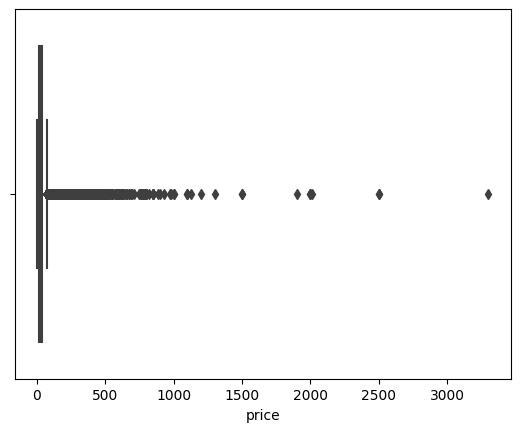

In [76]:
sns.boxplot(x = 'price', data = wine)

In [77]:
# instanciamos las clases
imputer_iterative = IterativeImputer(max_iter = 20, random_state = 42)

# ajustamos y tranformamos los datos
imputer_iterative_imputado = imputer_iterative.fit_transform(wine[["price"]])

# comprobamos que es lo que nos devuelve, que en este caso es un array también
imputer_iterative_imputado

array([[35.36338913],
       [15.        ],
       [14.        ],
       ...,
       [30.        ],
       [32.        ],
       [21.        ]])

In [78]:
wine["price_iterative"] = imputer_iterative_imputado

In [79]:
wine.describe()[["price","price_iterative"]]    

,price,price_iterative
count,129971.000000,129971.000000
mean,35.363389,35.363389
std,39.577066,39.577066
min,4.000000,4.000000
25%,18.000000,18.000000
50%,28.000000,28.000000
75%,40.000000,40.000000
max,3300.000000,3300.000000


In [80]:
wine.columns

Index(['Unnamed: 0', 'country', 'description', 'designation', 'points',
       'province', 'region_1', 'region_2', 'taster_name',
       'taster_twitter_handle', 'title', 'variety', 'winery', 'price',
       'price_iterative'],
      dtype='object')

Eliminar columna price y cambiar el nombre de price_iterative a price

In [82]:
wine.drop(columns="price", axis = 1, inplace = True)

KeyError: "['price'] not found in axis"

In [83]:
nuevo_nombre = {"price_iterative" : "price"}
wine.rename(columns = nuevo_nombre, inplace = True)

In [84]:
wine.columns

Index(['Unnamed: 0', 'country', 'description', 'designation', 'points',
       'province', 'region_1', 'region_2', 'taster_name',
       'taster_twitter_handle', 'title', 'variety', 'winery', 'price'],
      dtype='object')

In [85]:
wine.isnull().sum()

Unnamed: 0                   0
country                      0
description                  0
designation                  0
points                       0
province                     0
region_1                     0
region_2                 79460
taster_name                  0
taster_twitter_handle    31213
title                        0
variety                      0
winery                       0
price                        0
dtype: int64

In [86]:
wine.drop(columns=['region_2', 'taster_twitter_handle'], axis = 1, inplace = True)

Corroboramos que se hayan hecho todos los cambios

In [88]:
wine.columns

Index(['Unnamed: 0', 'country', 'description', 'designation', 'points',
       'province', 'region_1', 'taster_name', 'title', 'variety', 'winery',
       'price'],
      dtype='object')

Limpieza csv wine 2

Columnas categóricas con nulos

In [64]:
# Obtenemos la lista de columnas categóricas que tienen nulos
nulos_esta_cat = wine[wine2.columns[wine2.isnull().any()]].select_dtypes(include = "O").columns
print("Las columnas categóricas que tienen nulos son : \n ")
print(nulos_esta_cat)

# sacamos el 'value_counts()' de cada una de las columnas categóricas que tienen nulos para saber como es la distribución de sus categorías
for col in nulos_esta_cat:
    print(f"La distribución de las categorías para la columna {col.upper()}")
    display(wine2[col].value_counts() / wine2.shape[0])  # display es una función utilizada para mostrar objetos de manera más legible en Jupyter Notebooks o entornos similares. 
    print("........................")

Las columnas categóricas que tienen nulos son : 
 
Index(['country', 'designation', 'province', 'region_1', 'region_2'], dtype='object')
La distribución de las categorías para la columna COUNTRY


country
US                        0.413417
Italy                     0.155556
France                    0.139787
Spain                     0.054780
Chile                     0.038534
Argentina                 0.037309
Portugal                  0.035261
Australia                 0.032843
New Zealand               0.021997
Austria                   0.020254
Germany                   0.016246
South Africa              0.014961
Greece                    0.005857
Israel                    0.004174
Hungary                   0.001531
Canada                    0.001299
Romania                   0.000921
Slovenia                  0.000623
Uruguay                   0.000610
Croatia                   0.000590
Bulgaria                  0.000510
Moldova                   0.000470
Mexico                    0.000417
Turkey                    0.000345
Georgia                   0.000285
Lebanon                   0.000245
Cyprus                    0.000205
Brazil                    0.000166
Macedonia   

........................
La distribución de las categorías para la columna DESIGNATION


designation
Reserve                                                                                  0.018234
Reserva                                                                                  0.011992
Estate                                                                                   0.010409
Barrel sample                                                                            0.008786
Riserva                                                                                  0.004996
Barrel Sample                                                                            0.004234
Brut                                                                                     0.004134
Crianza                                                                                  0.003333
Estate Grown                                                                             0.002975
Estate Bottled                                                                           0.002624
Dry     

........................
La distribución de las categorías para la columna PROVINCE


province
California                                0.294892
Washington                                0.064599
Tuscany                                   0.048241
Bordeaux                                  0.040489
Northern Spain                            0.032412
Mendoza Province                          0.031419
Oregon                                    0.030405
Burgundy                                  0.028543
Piedmont                                  0.027119
Veneto                                    0.026251
South Australia                           0.019903
Sicily & Sardinia                         0.016862
New York                                  0.016087
Northeastern Italy                        0.013132
Loire Valley                              0.011833
Alsace                                    0.011131
Marlborough                               0.010965
Southwest France                          0.010608
Central Italy                             0.010137
Southern Italy        

........................
La distribución de las categorías para la columna REGION_1


region_1
Napa Valley                                           0.041138
Columbia Valley (WA)                                  0.032962
Mendoza                                               0.023759
Russian River Valley                                  0.023660
California                                            0.022938
Paso Robles                                           0.020228
Willamette Valley                                     0.013887
Rioja                                                 0.012542
Toscana                                               0.012489
Sonoma County                                         0.012277
Brunello di Montalcino                                0.011568
Sicilia                                               0.011270
Alsace                                                0.010429
Sonoma Coast                                          0.009759
Carneros                                              0.009660
Dry Creek Valley                              

........................
La distribución de las categorías para la columna REGION_2


region_2
Central Coast              0.086510
Sonoma                     0.074591
Columbia Valley            0.060671
Napa                       0.058312
California Other           0.023296
Willamette Valley          0.021076
Mendocino/Lake Counties    0.015829
Sierra Foothills           0.010998
Napa-Sonoma                0.010899
Finger Lakes               0.010005
Central Valley             0.007388
Long Island                0.005108
Southern Oregon            0.004386
Oregon Other               0.004380
North Coast                0.004187
Washington Other           0.003929
South Coast                0.001312
New York Other             0.000974
Name: count, dtype: float64

........................


Reemplazar nulos por Unknown

In [65]:
columnas_desconocido2 = ["country", "province", "region_1", "designation", "variety"]
wine_limpio = reemplazar_nulos_por_unknown(wine2, columnas_desconocido2)

Después del reemplazo usando 'fillna' quedan los siguientes nulos:
country        0
province       0
region_1       0
designation    0
variety        0
dtype: int64


Eliminar columna

In [96]:
wine2 = wine2.drop(columns='region_2')

KeyError: "['region_2'] not found in axis"

Contar porcentaje de nulos en cada columna

In [97]:
wine2.isnull().sum()

Unnamed: 0         0
country            0
description        0
designation        0
points             0
price          13695
province           0
region_1           0
variety            0
winery             0
dtype: int64

Imputar la columna numerica price

/opt/homebrew/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='price'>

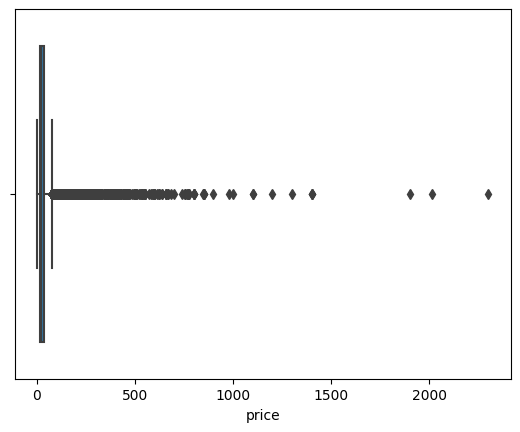

In [98]:
sns.boxplot(x = 'price', data = wine2)

Utilizamos iterative imputer

In [100]:
# instanciamos las clases
imputer_iterative = IterativeImputer(max_iter = 20, random_state = 42)

# ajustamos y tranformamos los datos
imputer_iterative_imputado = imputer_iterative.fit_transform(wine2[["price"]])

# comprobamos que es lo que nos devuelve, que en este caso es un array también
imputer_iterative_imputado

array([[235.],
       [110.],
       [ 90.],
       ...,
       [ 20.],
       [ 52.],
       [ 15.]])

In [101]:
wine2["price_iterative"] = imputer_iterative_imputado

In [102]:
wine2.describe()[["price","price_iterative"]]   

,price,price_iterative
count,137235.000000,150930.000000
mean,33.131482,33.131482
std,36.322536,34.635438
min,4.000000,4.000000
25%,16.000000,16.000000
50%,24.000000,26.000000
75%,40.000000,38.000000
max,2300.000000,2300.000000


Imputamos con KNN, para ver las diferencias

In [104]:
# instanciamos la clase del KNNImputer
imputer_knn = KNNImputer(n_neighbors = 5)

# ajustamos y transformamos los datos
imputer_knn_imputado = imputer_knn.fit_transform(wine2[["price"]])

# comprobamos que es lo que nos devuelve, que sigue siendo un array
imputer_knn_imputado

# por último nos queda añadir ese array al DataFrame como hemos hecho hasta ahora
wine2["price_knn"] = imputer_knn_imputado

In [105]:
wine2.describe()[["price","price_iterative", "price_knn"]]

,price,price_iterative,price_knn
count,137235.000000,150930.000000,150930.000000
mean,33.131482,33.131482,33.131482
std,36.322536,34.635438,34.635438
min,4.000000,4.000000,4.000000
25%,16.000000,16.000000,16.000000
50%,24.000000,26.000000,26.000000
75%,40.000000,38.000000,38.000000
max,2300.000000,2300.000000,2300.000000


Comprobamos las columnas

In [106]:
wine2.columns

Index(['Unnamed: 0', 'country', 'description', 'designation', 'points',
       'price', 'province', 'region_1', 'variety', 'winery', 'price_iterative',
       'price_knn'],
      dtype='object')

Eliminamos price y price_knn

In [107]:
wine2.drop(columns=["price", 'price_knn'], axis = 1, inplace = True)

renombramos price_iterative por price, para que sea la columna definitiva

In [108]:
nuevo_nombre = {"price_iterative" : "price"}
wine2.rename(columns = nuevo_nombre, inplace = True)

In [109]:
wine2.columns

Index(['Unnamed: 0', 'country', 'description', 'designation', 'points',
       'province', 'region_1', 'variety', 'winery', 'price'],
      dtype='object')

Corroboramos los cambios

In [110]:
wine2.isnull().sum()

Unnamed: 0     0
country        0
description    0
designation    0
points         0
province       0
region_1       0
variety        0
winery         0
price          0
dtype: int64

Concatenamos ambos df en uno solo

In [112]:
# Concatenar los DataFrames asegurando que todas las columnas de ambos DataFrames están presentes
wine_combinado = pd.concat([wine, wine2], axis=0, ignore_index=True, sort=False)
wine_combinado.tail(5)

,Unnamed: 0,country,description,designation,points,province,region_1,taster_name,title,variety,winery,price
280896,150925,Italy,Many people feel Fiano represents southern Ita...,Unknown,91,Southern Italy,Fiano di Avellino,NaN,NaN,White Blend,Feudi di San Gregorio,20.0
280897,150926,France,"Offers an intriguing nose with ginger, lime an...",Cuvée Prestige,91,Champagne,Champagne,NaN,NaN,Champagne Blend,H.Germain,27.0
280898,150927,Italy,This classic example comes from a cru vineyard...,Terre di Dora,91,Southern Italy,Fiano di Avellino,NaN,NaN,White Blend,Terredora,20.0
280899,150928,France,"A perfect salmon shade, with scents of peaches...",Grand Brut Rosé,90,Champagne,Champagne,NaN,NaN,Champagne Blend,Gosset,52.0
280900,150929,Italy,More Pinot Grigios should taste like this. A r...,Unknown,90,Northeastern Italy,Alto Adige,NaN,NaN,Pinot Grigio,Alois Lageder,15.0


In [115]:
wine_combinado.shape[0]

280901

In [116]:
wine_combinado.isnull().sum()/wine_combinado.shape[0]

Unnamed: 0     0.000000
country        0.000000
description    0.000000
designation    0.000000
points         0.000000
province       0.000000
region_1       0.000000
taster_name    0.537307
title          0.537307
variety        0.000000
winery         0.000000
price          0.000000
dtype: float64

In [119]:
wine_combinado.to_csv('wine_combinado.csv')